### 0. import all of the libraies that are needed

In [1]:
# Checking and making sure that we have kaggle installed on your machine/vm
!pip install kaggle

In [2]:
# Using the Google library upload function
# This will allow us to upload our Kaggle API key
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"thomasacton","key":"b4624c7c9bc3ecefc4edd15f71cae5a9"}'}

In [3]:
# Create the kgaggle folder in order to use to store the API key as a json file
!mkdir -p ~/.kaggle
!cp -r kaggle.json ~/.kaggle/

#Changing the permission (Permissions of 600 mean that the owner has full read and write access to the file)
!chmod 600  ~/.kaggle/kaggle.json
#unzipping the zip files and deleting the zip files

In [4]:
# Download the dataset that we will be using
!kaggle datasets download -d prashant268/chest-xray-covid19-pneumonia

# Unzip the folder and then remove it from our directory
!unzip \*.zip  && rm *.zip

Streaming output truncated to the last 5000 lines.
  inflating: Data/train/COVID19/COVID19(256).jpg  
  inflating: Data/train/COVID19/COVID19(257).jpg  
  inflating: Data/train/COVID19/COVID19(258).jpg  
  inflating: Data/train/COVID19/COVID19(259).jpg  
  inflating: Data/train/COVID19/COVID19(26).jpg  
  inflating: Data/train/COVID19/COVID19(260).jpg  
  inflating: Data/train/COVID19/COVID19(262).jpg  
  inflating: Data/train/COVID19/COVID19(263).jpg  
  inflating: Data/train/COVID19/COVID19(264).jpg  
  inflating: Data/train/COVID19/COVID19(265).jpg  
  inflating: Data/train/COVID19/COVID19(266).jpg  
  inflating: Data/train/COVID19/COVID19(267).jpg  
  inflating: Data/train/COVID19/COVID19(268).jpg  
  inflating: Data/train/COVID19/COVID19(27).jpg  
  inflating: Data/train/COVID19/COVID19(270).jpg  
  inflating: Data/train/COVID19/COVID19(271).jpg  
  inflating: Data/train/COVID19/COVID19(272).jpg  
  inflating: Data/train/COVID19/COVID19(273).jpg  
  inflating: Data/train/COVID19/C

In [5]:

# lets move the folder that we dont need, in this kernal we will be removing the Normal X-ray Folder. This includes the test and training sets 
!rm -rf /content/Data/test/NORMAL
!rm -rf /content/Data/train/NORMAL


In [6]:
# Checking the type of machine specificcation that we have allocated 
from tensorflow.python.client import device_lib
#device_lib.list_local_devices()

In [7]:
# https://www.tutorialspoint.com/google_colab/google_colab_quick_guide.htm
import tensorflow as tf 

# Checking the amount of GPU available
physical_devices_GPU = tf.config.list_physical_devices('GPU')
print("Num GPUs:", len(physical_devices_GPU))
#-------------------------------------------------------------------

# Checking the amount of CPU available
physical_devices_CPU = tf.config.list_physical_devices('CPU')
print("Num CPUs:", len(physical_devices_CPU))



Num GPUs: 1
Num CPUs: 1


In [8]:
# check the GPU that we will be using # reference https://colab.research.google.com/notebooks/pro.ipynb
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Sat Aug 22 21:05:26 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.57       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P0    28W / 250W |     10MiB / 16280MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [9]:
# Importing the libraries that we we need 

# General libraries 
import os
import numpy as np
import cv2  
import seaborn as sns     

from random import shuffle
from collections import Counter
from tqdm import tqdm 
from datetime import datetime
from collections import Counter

import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Torrce Libary
import torch
import torch.nn.functional as F
from torchvision import transforms, datasets, models
from torch import nn, optim

from sklearn.metrics import confusion_matrix

# Reference - https://www.tensorflow.org/
# Google TensorFlow
import tensorflow as tf 
from tensorflow import keras
from tensorflow.keras import Model
from tensorflow.keras.utils import plot_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau , ModelCheckpoint , EarlyStopping
from collections import Counter

# Reference - https://keras.io/
# Keras
from keras import models
from keras import layers
from keras.applications import VGG16
from keras import optimizers

from keras import backend as K 
from keras.layers import Dense, GlobalAveragePooling2D, Dropout, Flatten , AveragePooling2D , Lambda
from keras.layers.normalization import BatchNormalization
from keras.applications import MobileNetV2, MobileNet
from keras.preprocessing import image
from keras.applications.mobilenet import preprocess_input
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Model
from keras.optimizers import Adam, Adamax

#-------------- libraries that we need to install --------------#
# Additional libraries 
# efficientnet
!pip install efficientnet
import efficientnet.tfkeras as efn

# Ploty
!pip install plotly
import plotly.graph_objects as px 

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


     |████████████████████████████████| 51kB 2.4MB/s 


###  1. Getting the Data

In [10]:
# This is the data that we will be using for the Project

training_Image_folder= './Data/train/' 
test_Image_folder= './Data/test/'

# Training set
get_training_Pneumonia_images = os.listdir('./Data/train/PNEUMONIA')
get_training_COVID19_images =   os.listdir('./Data/train/COVID19')

# Test set
get_test_Pneumonia_images =  os.listdir('./Data/test/PNEUMONIA')
get_test_COVID19_images = os.listdir('./Data/test/COVID19')


###  2. Discover and visualize the data to gain insights

In [11]:
# Training set
NUM_TRAINING_IMAGES = len(get_training_Pneumonia_images) + len(get_training_COVID19_images)

pneumonia_training_percentage = len(get_training_Pneumonia_images) /NUM_TRAINING_IMAGES
pneumonia_training_percentage  = pneumonia_training_percentage * 100

covid_training_percentage = len(get_training_COVID19_images) /NUM_TRAINING_IMAGES
covid_training_percentage  = covid_training_percentage * 100


print("Training set\n")
print("There are -",len(get_training_Pneumonia_images),
      "\tTraining Pneumonia Chest X-ray Images\t"
      , "(", "%.2f" % pneumonia_training_percentage ,"%) of the data")

print("There are -",len(get_training_COVID19_images),
      "\tTraining Covid19 Chest X-ray Images\t",
      "(", "%.2f" % covid_training_percentage ,"%) of the data")

print("There are -",NUM_TRAINING_IMAGES, "\tTotal training Images")

print("\nTraining set\n")

# Test set
NUM_TEST_IMAGES = len(get_test_Pneumonia_images) + len(get_test_COVID19_images)

pneumonia_test_percentage = len(get_test_Pneumonia_images) /NUM_TEST_IMAGES
pneumonia_test_percentage  = pneumonia_test_percentage * 100

covid_test_percentage = len(get_test_COVID19_images) /NUM_TEST_IMAGES
covid_test_percentage  = covid_test_percentage * 100

print("There are -",len(get_test_Pneumonia_images),
      "\tTest Pneumonia Chest X-ray Imagest",
      "(", "%.2f" % pneumonia_test_percentage ,"%) of the data")

print("There are -",len(get_test_COVID19_images),
      "\tTest Covid19 Chest X-ray Imagest",
      "(", "%.2f" % covid_test_percentage ,"%) of the data")

print("There are -",NUM_TEST_IMAGES, "Total test Images")

Training set

There are - 3418 	Training Pneumonia Chest X-ray Images	 ( 88.14 %) of the data
There are - 460 	Training Covid19 Chest X-ray Images	 ( 11.86 %) of the data
There are - 3878 	Total training Images

Training set

There are - 855 	Test Pneumonia Chest X-ray Imagest ( 88.05 %) of the data
There are - 116 	Test Covid19 Chest X-ray Imagest ( 11.95 %) of the data
There are - 971 Total test Images


In [12]:
x = ['Pneumonia', 'COVID19'] 
  
plot = px.Figure(data=[px.Bar( 
    name = 'Training', 
    x = x, 
    y = [len(get_training_Pneumonia_images), len(get_training_COVID19_images)] 
   ), 
                       px.Bar( 
    name = 'Test', 
    x = x, 
    y = [len(get_test_Pneumonia_images), len(get_test_COVID19_images)] 
   ) 
]) 
  
plot.update_layout(barmode='stack') 
                   
plot.show()

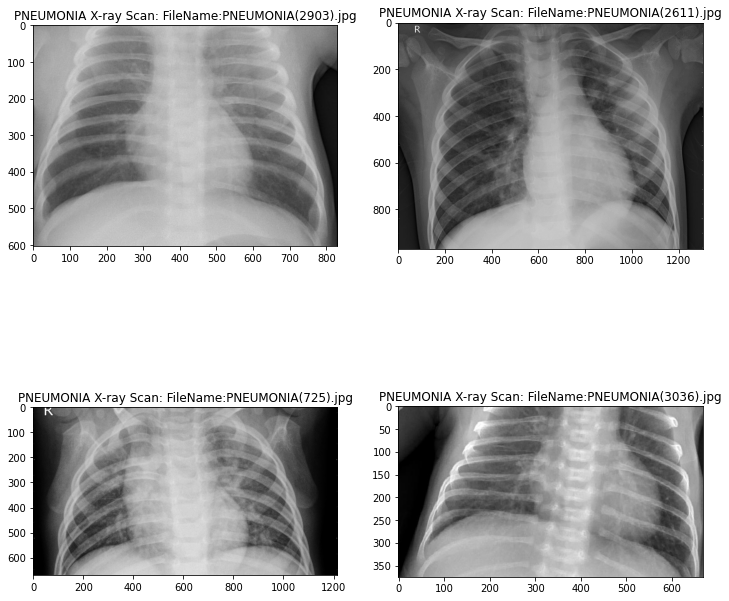

In [13]:
plt.figure(figsize=(12,12))
for i in range(4):
    plt.subplot(2, 2, i + 1)
    plt.imshow(plt.imread(os.path.join(training_Image_folder +
                                       "/PNEUMONIA",get_training_Pneumonia_images[i])),cmap='gray')
    plt.title("PNEUMONIA X-ray Scan: FileName:" + str(get_training_Pneumonia_images[i]))
plt.show()


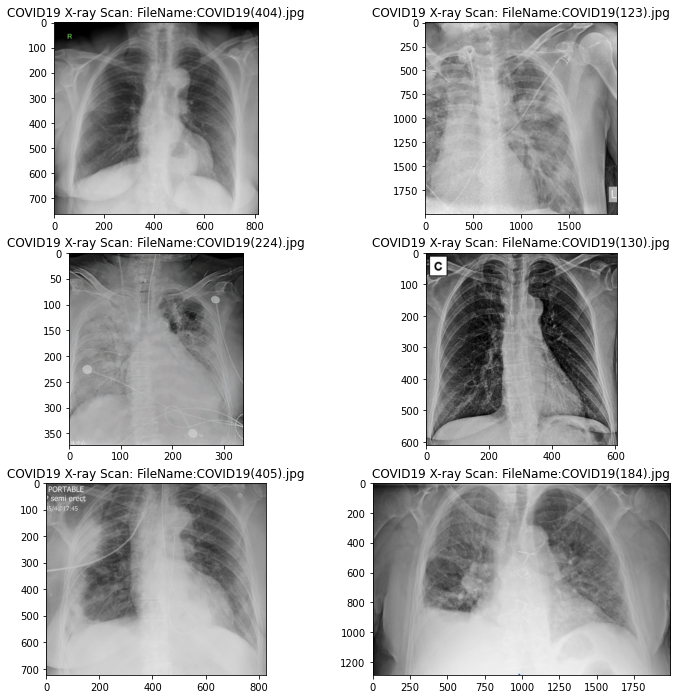

In [14]:
plt.figure(figsize=(12,12))
for i in range(6):
    plt.subplot(3, 2, i + 1)
    plt.imshow(plt.imread(os.path.join(training_Image_folder +"/COVID19",get_training_COVID19_images[i])),cmap='gray')
    plt.title("COVID19 X-ray Scan: FileName:" + str(get_training_COVID19_images[i]))
plt.show()

## 2. Helper Functions that will useful later on 


In [15]:
# We will be using  function allows us to display our training curve (Training score) and Cross-validation score
def display_training_curves(training_set, validation_se, title, subplot):
    if subplot%10==1: #
        plt.subplots(figsize=(10,14), facecolor='#fcfafa')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.grid()
    ax.set_facecolor('#858b97')
    ax.plot(training_set, 'o-', color="r", label="Training score")
    ax.plot(validation_se,'v-', color="g", label="Cross-validation score")
    ax.set_title('Data for Model '+ title)
    ax.set_ylabel(title)
    ax.set_xlabel('epoch')
    ax.legend(['training', 'validation'])

In [16]:
# This is the function that we will be using for the confusion_matrix

# Creating our function for reall 
def recall(y_true, y_pred):
  cm  = confusion_matrix(y_true, y_pred)
  tn, fp, fn, tp = cm.ravel()
  return tp/(tp+fn)

# Creating our function for reall 
def precision(y_true, y_pred):
  cm  = confusion_matrix(y_true, y_pred)
  tn, fp, fn, tp = cm.ravel()
  print("True Negative", tn)
  print("False Positive", fp)
  print("False Negative",fn)
  print("True Positive", tp)
  return tp/(tp+fp)

In [17]:
# we wil be using this function to process the image"
def proc_img(img_path):
  img = image.load_img(img_path, target_size=(image_size, image_size,3))
  x_img = image.img_to_array(img)
  x_img = np.expand_dims(x_img, axis=0)
  x_img = preprocess_input(x_img)
  return x_img

In [18]:
# Reference - https://keras.io/examples/vision/grad_cam/
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, classifier_layer_names):
    # Create a model that maps an input image to the activations of the last Convolutional layer
    get_last_convolutional_layer = model.get_layer(last_conv_layer_name)
    last_conv_layer_model = keras.Model(model.inputs, get_last_convolutional_layer.output)

    # Second, we create a model that maps the activations of the last conv
    # layer to the final class predictions
    classifier_input = keras.Input(shape=get_last_convolutional_layer.output.shape[1:])
    x = classifier_input
    for layer_name in classifier_layer_names:
        x = model.get_layer(layer_name)(x)
    classifier_model = keras.Model(classifier_input, x)

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        # Compute activations of the last conv layer and make the tape watch it
        last_conv_layer_output = last_conv_layer_model(img_array)
        tape.watch(last_conv_layer_output)
        # Compute class predictions
        preds = classifier_model(last_conv_layer_output)
        top_pred_index = tf.argmax(preds[0])
        top_class_channel = preds[:, top_pred_index]

    # This is the gradient of the top predicted class with regard to
    # the output feature map of the last conv layer
    grads = tape.gradient(top_class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    last_conv_layer_output = last_conv_layer_output.numpy()[0]
    pooled_grads = pooled_grads.numpy()
    for i in range(pooled_grads.shape[-1]):
        last_conv_layer_output[:, :, i] *= pooled_grads[i]

    # The channel-wise mean of the resulting feature map
    # is our heatmap of class activation
    heatmap = np.mean(last_conv_layer_output, axis=-1)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)
    return heatmap, top_pred_index.numpy()

In [19]:
# https://keras.io/examples/vision/grad_cam/
def superimposed_img(image, heatmap):
    # We rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # We use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # We use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # We create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((image_size, image_size))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * 0.4 + image
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)
    return superimposed_img

In [20]:
labels = ['COVID19', 'PNEUMONIA']

## 3. Prepare the data for Machine Learning Algorithms

In [21]:
data_path = '/content/Data/'

rate_Of_Learning=0.0001 # Setting the learning reate value
epochs_n =  30 # Setting the number of epochs we want our machine learning algorithm to go through
image_size = 256 # Settting size that we want want our images to be
BATCH_SIZE = 16 # Setting the batch size

In [22]:
# This is our training folder imaage data generation
train_datagen = ImageDataGenerator(rescale = 1./255,
                                   zoom_range = 0.2,
                                   rotation_range=15,
                                   horizontal_flip = True,
                                   validation_split = 0.1) # we will be using 10% of the data for validation 

In [23]:
# Training Set  
train_generator = train_datagen.flow_from_directory(data_path + '/train/', 
                                                 target_size=(image_size,image_size),
                                                 batch_size=BATCH_SIZE,
                                                 class_mode='categorical',
                                                 subset = "training",
                                                 )
# Here we are using some of the training data to be used a part of our Validation set
validation_generator = train_datagen.flow_from_directory(data_path + '/train/', 
                                               target_size = (image_size, image_size),
                                               batch_size = BATCH_SIZE,
                                               class_mode = 'categorical',
                                               subset = "validation",
                                              )

Found 3491 images belonging to 2 classes.
Found 387 images belonging to 2 classes.


In [24]:
# very very important for class weights
# #https://github.com/keras-team/keras/issues/1875#issuecomment-273752868
# Reference - https://stackoverflow.com/questions/42586475/is-it-possible-to-automatically-infer-the-class-weight-from-flow-from-directory

from collections import Counter
counter = Counter(train_generator.classes)                          
max_val = float(max(counter.values()))       
class_weights = {
    class_id : max_val/num_images 
    for class_id, num_images in counter.items()
    }                     


In [25]:
'''
There are - 3418 	Training Pneumonia Chest X-ray Images	 ( 88.14 %) of the data
There are - 460 	Training Covid19 Chest X-ray Images	 ( 11.86 %) of the data
There are - 3878 	Total training Images

So this means that if we miss-classify Covid19 the loss will be 7.432367149758454 times more than miss-classifying Pneumonia 
'''
print(class_weights)

{0: 7.432367149758454, 1: 1.0}


In [26]:
train_generator.class_indices # Checking to see how what number will be assigned to each clas 
# In this case we have : {'COVID19': 0, 'PNEUMONIA': 1}

{'COVID19': 0, 'PNEUMONIA': 1}

In [27]:
validation_generator.class_indices # Checking to see how what number will be assigned to each clas 
# In this case we have : {'COVID19': 0, 'PNEUMONIA': 1}

{'COVID19': 0, 'PNEUMONIA': 1}

In [28]:
labels = ['COVID19', 'PNEUMONIA']

In [29]:
K.clear_session() # Clearing the Keras backend to make sure that nothing is running
# All callbacks here 

# training call backs setting
# https://keras.io/api/callbacks/reduce_lr_on_plateau/

# Check point call back 
# checkpoint = ModelCheckpoint(filepath,  monitor='val_loss', verbose=1, save_best_only=True, mode='min')

filepath="weights.hdf5" # The name we will save the model as

# reduce_on_plateau # reference - https://keras.io/api/callbacks/reduce_lr_on_plateau/
lr_reduce = ReduceLROnPlateau(monitor='val_loss', factor=0.2, min_delta=0.0001, patience=5, verbose=1)

# Early Sottping callback # reference - https://keras.io/api/callbacks/early_stopping/
early_Stopping_callback = EarlyStopping(monitor='val_loss', mode='auto', patience=3, verbose=1)

#reference - from Hands-On Machine Learning with Scikit-Learn and TensorFlow vs 

root_logdir = os.path.join(os.curdir, "model_1_log")
def get_run_logdir():
    import time
    run_id = time.strftime("run_%Y_%m_%d-%H_%M_%S")
    return os.path.join(root_logdir, run_id)
run_logdir = get_run_logdir()

tensorboard_cb = keras.callbacks.TensorBoard(run_logdir)

callbacks_list = [lr_reduce, early_Stopping_callback, tensorboard_cb]


In [30]:
STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

In [31]:
# label smoothing https://www.linkedin.com/pulse/label-smoothing-solving-overfitting-overconfidence-code-sobh-phd/
def categorical_smooth_loss(y_true, y_pred, label_smoothing=0.1):
    loss = tf.keras.losses.categorical_crossentropy(y_true, y_pred, label_smoothing=label_smoothing)
    return loss

## 4. Train the Machine Learning Algorithms


## Model 1 - VGG16


In [32]:
# Reference - https://keras.io/api/applications/vgg/#vgg16-function

from keras.applications import VGG16

# Here we will be loading a model that has already been pretrained and 
# using the weights of imagenet(http://image-net.org/) 

VGG16_trnasfer_learning_model = VGG16(input_shape=(image_size, image_size, 3),weights="imagenet",include_top=False) #

'''
 we are using transfer learning- the way we achieve this is by freezing all of the layers of the network to its current state  
 we will train the new layersd of the model without updating its weights. As a result of this approach, the new output 
 layers will learn to interpre the new learning features of the model. 
'''
# Freeze all of the layers
for layer in VGG16_trnasfer_learning_model.layers:
  layer.trainable = False

# Adding our own layer to the newtork

'''
Based on the following paper listen below we will be setting our dropout 40% : 
Doing this will stop out model from overfitting during training
  Dropout: A Simple Way to Prevent Neural Networks from Overfitting 
  Source https://jmlr.org/papers/volume15/srivastava14a/srivastava14a.pdf
  page 1940 on Table 6: Results on the ILSVRC-2012 validation/test set.

'''
x1 = VGG16_trnasfer_learning_model.output
x1 = AveragePooling2D(name="averagepooling2d_head")(x1)
x1 = Flatten(name="flatten_head")(x1)
x1 = Dense(128, activation="relu", name="dense_head")(x1)
x1 = Dropout(0.4, name="dropout_head")(x1) 
x1 = Dense(64, activation="relu", name="dense_head_2")(x1)
x1 = Dropout(0.4, name="dropout_head_2")(x1)
VGG16_model_output = Dense(2, activation='softmax', name="predictions_head")(x1)


VGG16_model = Model(inputs=VGG16_trnasfer_learning_model.input, outputs=VGG16_model_output)
VGG16_model.compile(optimizer=Adam(learning_rate=rate_Of_Learning),loss=categorical_smooth_loss,metrics=['accuracy'])

VGG16_model.summary()

58892288/58889256 [==============================] - 1s 0us/step
Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 256, 256, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 256, 256, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 128, 128, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 128, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 128, 128)     147584    
_______________________________________________________

the network has 26 layers


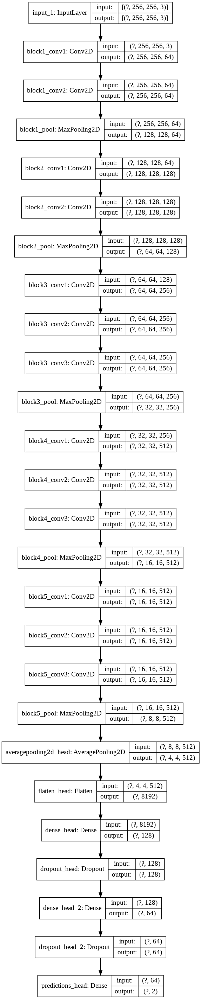

In [33]:
print('the network has {} layers'.format(len(VGG16_model.layers)))
plot_model(VGG16_model, show_shapes=True, to_file='VGG16_model.png')

In [34]:
#reference - from Hands-On Machine Learning with Scikit-Learn and TensorFlow book 2nd 
root_logdir = os.path.join(os.curdir, "model_1_log")
def get_run_logdir():
    import time
    run_id = time.strftime("run_%Y_%m_%d-%H_%M_%S")
    return os.path.join(root_logdir, run_id)
run_logdir = get_run_logdir()

tensorboard_cb = keras.callbacks.TensorBoard(run_logdir)

In [35]:
import timeit

start = timeit.default_timer()

history_vgg16 = VGG16_model.fit_generator(generator=train_generator,
                                          steps_per_epoch=STEP_SIZE_TRAIN,
                                          validation_steps = STEP_SIZE_VALID,
                                          validation_data=validation_generator,
                                          callbacks=[callbacks_list],
                                          epochs=epochs_n,
                                          class_weight=class_weights
                                          )
stop = timeit.default_timer()
print('Time: ', stop - start)  

Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/30
  1/218 [..............................] - ETA: 0s - loss: 1.1442 - accuracy: 0.0625WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
218/218 [==============================] - 91s 419ms/step - loss: 0.9177 - accuracy: 0.7554 - val_loss: 0.2806 - val_accuracy: 0.9740
Epoch 2/30
218/218 [==============================] - 90s 414ms/step - loss: 0.6031 - accuracy: 0.9286 - val_loss: 0.2357 - val_accuracy: 0.9870
Epoch 3/30
218/218 [==============================] - 90s 412ms/step - loss: 0.5278 - accuracy: 0.9540 - val_loss: 0.2293 - val_accuracy: 0.9922
Epoch 4/30
218/218 [==============================] - 90s 412ms/step - loss: 0.4951 - accuracy: 0.9695 - val_loss: 0.2700 - val

In [36]:
%load_ext tensorboard
%tensorboard --logdir /content/model_1_log/

Output hidden; open in https://colab.research.google.com to view.

# Test our model


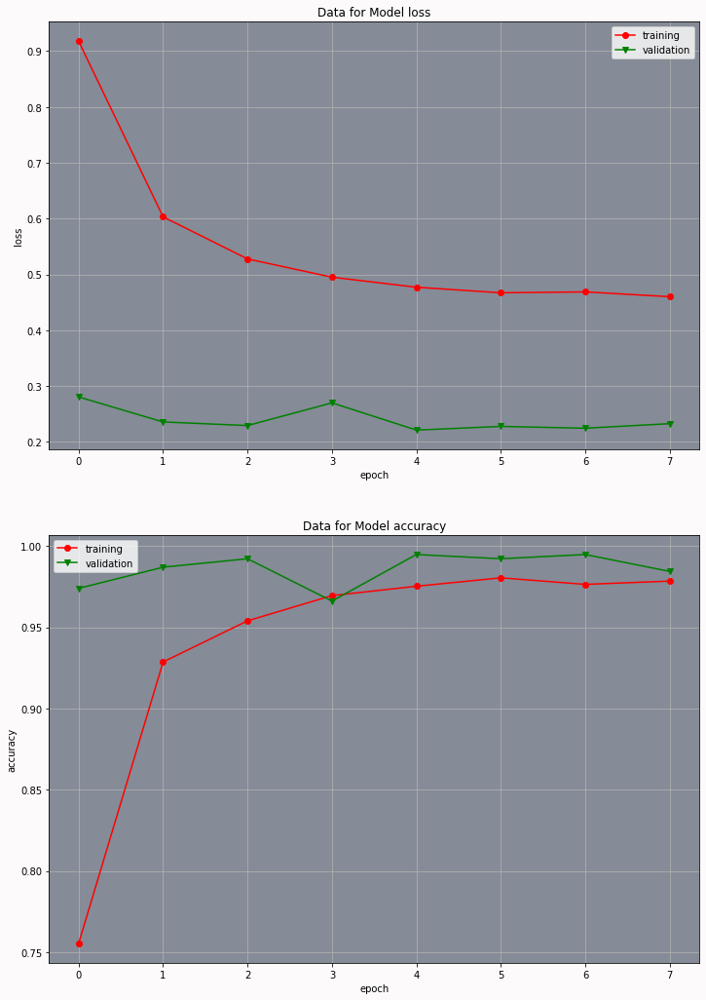

In [37]:
display_training_curves(history_vgg16.history['loss'], history_vgg16.history['val_loss'], 'loss', 211)
display_training_curves(history_vgg16.history['accuracy'], history_vgg16.history['val_accuracy'], 'accuracy', 212)

## Test our model

In [38]:
last_conv_layer_name = "block5_pool"
classifier_layer_names = [
    "averagepooling2d_head",
    "flatten_head",
    "dense_head",
    "dropout_head",
    "dense_head_2",
    "dropout_head_2",
    "predictions_head"
]

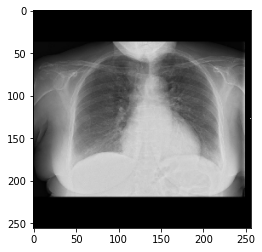

In [39]:
# test image

import cv2  
file_path =  test_Image_folder + '/COVID19/COVID19(100).jpg'
test_image = cv2.imread(file_path)
test_image = cv2.resize(test_image, (image_size,image_size),interpolation=cv2.INTER_NEAREST)
plt.imshow(test_image)
test_image = np.expand_dims(test_image,axis=0)

In [40]:
heatmap, top_index = make_gradcam_heatmap(test_image, VGG16_model, last_conv_layer_name, classifier_layer_names)
print("COVID-PREDICT: as", labels[top_index])

COVID-PREDICT: as COVID19


In [41]:
test_datagen = ImageDataGenerator(rescale=1. / 255)

eval_generator = test_datagen.flow_from_directory(
    test_Image_folder,target_size=(image_size,image_size), 
    batch_size=BATCH_SIZE,
    shuffle = True,
    class_mode="categorical")

eval_generator.reset()

x = VGG16_model.evaluate_generator(eval_generator, 
                             steps = np.ceil(len(eval_generator) / BATCH_SIZE), 
                             use_multiprocessing = False, 
                             verbose = 1, workers=1)
print('Test loss:' , x[0])
print('Test accuracy:',x[1])

Found 971 images belonging to 2 classes.
Instructions for updating:
Please use Model.evaluate, which supports generators.
4/4 [==============================] - 1s 195ms/step - loss: 0.2131 - accuracy: 1.0000
Test loss: 0.21312513947486877
Test accuracy: 1.0


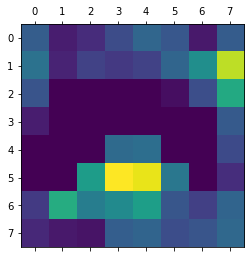

In [42]:
plt.matshow(heatmap)
plt.show()

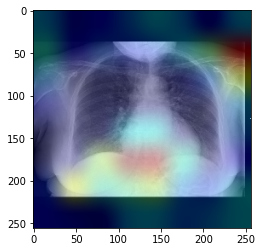

In [43]:
s_img = superimposed_img(test_image[0], heatmap)
plt.imshow(s_img)

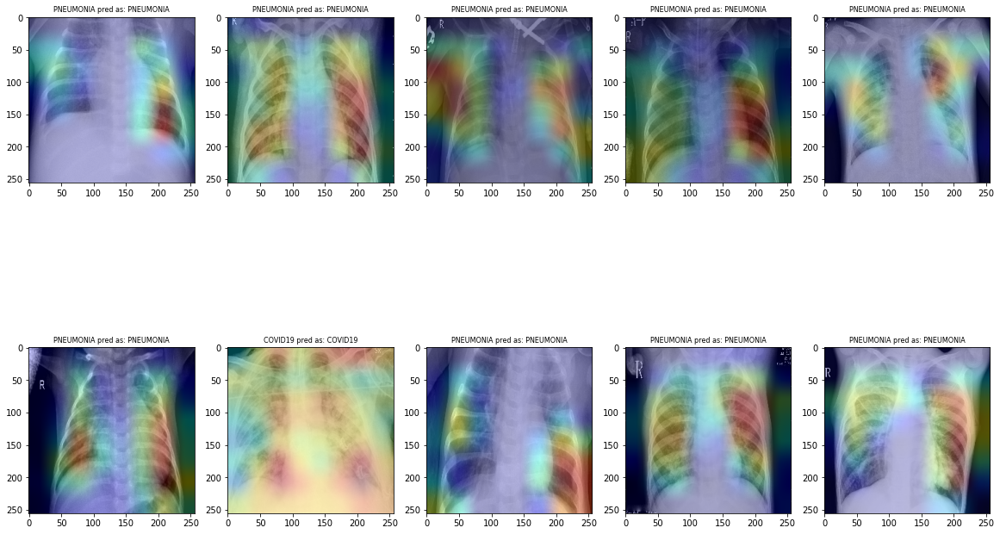

In [44]:
sample_data = eval_generator.__getitem__(1)[0] 
sample_label = eval_generator.__getitem__(1)[1] 

plt.figure(figsize=(20,20))
for i in range(10):
    plt.subplot(3, 5, i + 1)
    plt.axis('on')
    heatmap, top_index = make_gradcam_heatmap(np.expand_dims(sample_data[i], axis=0), VGG16_model, last_conv_layer_name, classifier_layer_names)
    img = np.uint8(255 * sample_data[i])
    s_img = superimposed_img(img, heatmap)
    plt.imshow(s_img)
    plt.title(labels[np.argmax(sample_label[i])] + " pred as: " + labels[top_index], fontsize=8)

In [45]:
from pathlib import Path
import pandas as pd
test_path = Path('./Data/test')

# Get the path to the covid and pneumonia 
covid19_cases_dir = test_path / 'COVID19'
pneumonia_cases_dir = test_path / 'PNEUMONIA'

# Get the list of all the images
covid19_cases = covid19_cases_dir.glob('*.jpg')
pneumonia_cases = pneumonia_cases_dir.glob('*.jpg')

# An empty list. We will insert the data into this list in (img_path, label) format
test_data = []

# Go through all the covid cases. The label for these cases will be 0
for img in covid19_cases:
    test_data.append((img,0))

# Go through all the pneumonia cases. The label for these cases will be 1
for img in pneumonia_cases:
    test_data.append((img, 1))

# Get a pandas dataframe from the data we have in our list 
test_data = pd.DataFrame(test_data, columns=['image', 'label'], index=None)

# Shuffle the data 
test_data = test_data.sample(frac=1.).reset_index(drop=True)

In [46]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 971 entries, 0 to 970
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   971 non-null    object
 1   label   971 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 15.3+ KB


In [47]:
test_data.head()

,image,label
0,Data/test/COVID19/COVID19(569).jpg,0
1,Data/test/PNEUMONIA/PNEUMONIA(77).jpg,1
2,Data/test/PNEUMONIA/PNEUMONIA(4244).jpg,1
3,Data/test/COVID19/COVID19(160).jpg,0
4,Data/test/PNEUMONIA/PNEUMONIA(3060).jpg,1


In [48]:
# x_test = np.zeros((971, image_size, image_size, 3))
x_test = np.zeros((971, image_size, image_size, 3))
i = 0
for x in test_data['image']:
  im_path = './'+np.str(x)
  
  x_test[i] = np.asarray(proc_img(im_path))
  i+=1
  
y_test_true = np.asarray(test_data['label'])

In [49]:
y_test_pred = np.argmax(VGG16_model.predict(x_test), axis=1)

In [50]:
from sklearn.metrics import classification_report

print("[INFO] evaluating network...")
predIdxs = VGG16_model.predict(x_test, batch_size=BATCH_SIZE)
predIdxs = np.argmax(predIdxs, axis=1)
print(classification_report(y_test_true, predIdxs, target_names=labels))
confus_matrix = confusion_matrix(y_test_true, predIdxs)
total = sum(sum(confus_matrix))

acc = (confus_matrix[0, 0] + confus_matrix[1, 1]) / total
sensitivity = confus_matrix[0, 0] / (confus_matrix[0, 0] + confus_matrix[0, 1])
specificity = confus_matrix[1, 1] / (confus_matrix[1, 0] + confus_matrix[1, 1])
print(confus_matrix)
print ('\n')
print("Accuracy: {:.4f}".format(acc))
print("Sensitivity: {:.4f}".format(sensitivity))
print("Specificity: {:.4f}".format(specificity))


[INFO] evaluating network...
              precision    recall  f1-score   support

     COVID19       0.96      0.98      0.97       116
   PNEUMONIA       1.00      0.99      1.00       855

    accuracy                           0.99       971
   macro avg       0.98      0.99      0.98       971
weighted avg       0.99      0.99      0.99       971

[[114   2]
 [  5 850]]


Accuracy: 0.9928
Sensitivity: 0.9828
Specificity: 0.9942


In [51]:
VGG16_model.save("VGG16_model.h5")

In [52]:
def prnt_out(x_img):
  "prints the probability that the model predict with its label"
  pred = VGG16_model.predict(x_img)
  if pred[0,0] >= 0.5: 
      print('COVID-DETECT is {:.2%} sure this is COVID-19'.format(pred[0][0]))
  else: 
      print('COVID-DETECT is {:.2%} sure this is PNEUMONIA'.format(1-pred[0][0]))

In [53]:
# The local path to our target image
img_path ='/content/Data/test/PNEUMONIA/PNEUMONIA(2668).jpg'

x_img = proc_img(img_path)

COVID-DETECT is 99.10% sure this is PNEUMONIA


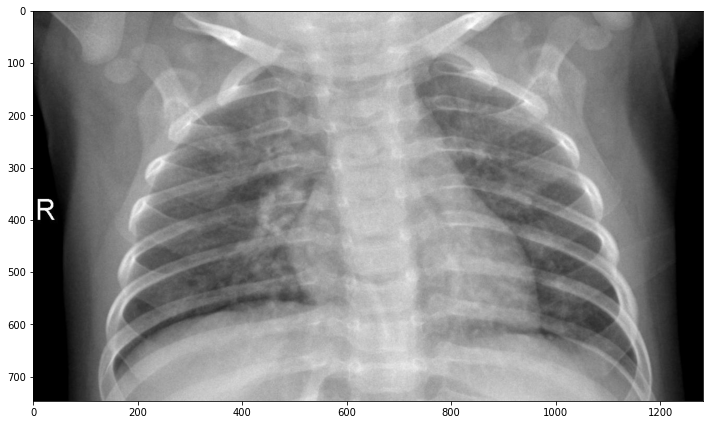

In [54]:
plt.rcParams['figure.figsize'] = (12.0, 10.0)
img_samp = cv2.imread(img_path)
plt.imshow(img_samp);
prnt_out(x_img)

In [55]:
##############################